# Etiquetado Automático de Frames usando OpenAI Vision API

Este notebook usa la API de OpenAI (GPT-4o Vision) para etiquetar automáticamente los frames ya procesados con CLIP.

**Objetivo:**
- Etiquetar automáticamente frames por tipo de contenido visual usando OpenAI Vision API
- Tomar como entrada el CSV generado por `frame_labeling_clip_v2.ipynb` (`df_frames_clip_labeled_v2.csv`)
- Agregar una nueva columna con la etiqueta proporcionada por OpenAI
- Comparar resultados entre CLIP y OpenAI

**Nota:** Requiere configuración de API key de OpenAI en variables de entorno o archivo `.env`


## Configuración Inicial


In [1]:
#pip install openai python-dotenv


In [9]:
import sys
import os
from pathlib import Path
import base64
from io import BytesIO

# Configurar paths
project_root = Path("/Users/andrestrepo/Documents/repos_personal/proyecto-vision-computador")
sys.path.insert(0, str(project_root))
sys.path.insert(0, str(project_root / "src"))

# Imports
import pandas as pd
import numpy as np
from PIL import Image
from tqdm import tqdm
from openai import OpenAI
from dotenv import load_dotenv
import warnings
import time
warnings.filterwarnings('ignore')

# Cargar variables de entorno
load_dotenv()

# Inicializar cliente de OpenAI
api_key = os.getenv('OPENAI_API_KEY_2')
if not api_key:
    print("⚠️  ADVERTENCIA: No se encontró OPENAI_API_KEY en variables de entorno")
else:
    print("✅ API key de OpenAI cargada correctamente")

client = OpenAI(api_key=api_key) if api_key else None


✅ API key de OpenAI cargada correctamente


## Configuración de Categorías

Usaremos las mismas categorías que en el notebook de CLIP para mantener consistencia.


In [11]:
# Categorías para clasificación (mismas que en CLIP)
CATEGORIES = [
    "a person speaking, presenting, or talking on camera, with a person visible in the center of the image",
    "a company logo, brand logo, or trademark image, without a person visible in the center",
    "a data table, spreadsheet table, or numerical table with rows and columns, without a person visible in the center",
    "a candlestick chart, Japanese candlestick chart, OHLC chart showing price movements, without a person visible in the center",
    "a line chart, line graph showing data trends over time, without a person visible in the center",
    "a bar chart, bar graph, column chart showing comparisons, without a person visible in the center",
    "only text overlay, subtitles, or captions displayed on screen, without a person visible in the center",
    "a plain background, solid color background, or full screen background image, without a person visible in the center",
    "a diagram, flowchart, or infographic showing information visually, without a person visible in the center",
    "a computer screen, application interface, or software screenshot, without a person visible in the center",
    "other type of visual content not matching the above categories, without a person visible in the center"
]

# Short codes for categories
CATEGORY_CODES = [
    "person",
    "logo",
    "table",
    "candlestick",
    "line_chart",
    "bar_chart",
    "text",
    "background",
    "diagram",
    "screenshot",
    "other"
]

print(f"📋 Categorías definidas: {len(CATEGORIES)}")
for i, (cat, code) in enumerate(zip(CATEGORIES, CATEGORY_CODES), 1):
    print(f"  {i}. [{code}] {cat[:60]}...")


📋 Categorías definidas: 11
  1. [person] a person speaking, presenting, or talking on camera, with a ...
  2. [logo] a company logo, brand logo, or trademark image, without a pe...
  3. [table] a data table, spreadsheet table, or numerical table with row...
  4. [candlestick] a candlestick chart, Japanese candlestick chart, OHLC chart ...
  5. [line_chart] a line chart, line graph showing data trends over time, with...
  6. [bar_chart] a bar chart, bar graph, column chart showing comparisons, wi...
  7. [text] only text overlay, subtitles, or captions displayed on scree...
  8. [background] a plain background, solid color background, or full screen b...
  9. [diagram] a diagram, flowchart, or infographic showing information vis...
  10. [screenshot] a computer screen, application interface, or software screen...
  11. [other] other type of visual content not matching the above categori...


## Cargar Dataset Preprocesado con Etiquetas CLIP


In [14]:
# Cargar dataset con etiquetas CLIP
input_path = project_root / "src" / "notebooks" / "datasets" / "df_frames_clip_labeled_v3.csv"

if not input_path.exists():
    print(f"❌ No se encontró el archivo: {input_path}")
    print("   Ejecuta primero el notebook frame_labeling_clip_v2.ipynb")
else:
    df_frames_selected = pd.read_csv(input_path)
    print(f"✅ Dataset cargado: {len(df_frames_selected):,} frames")
    print(f"   Columnas: {df_frames_selected.columns.tolist()}")

    
    # Verificar que tiene las columnas esperadas
    required_cols = ['frame_path', 'clip_category_code']
    missing_cols = [col for col in required_cols if col not in df_frames_selected.columns]
    if missing_cols:
        print(f"\n⚠️  ADVERTENCIA: Faltan columnas: {missing_cols}")
    else:
        print(f"\n✅ Todas las columnas requeridas están presentes")
    print(f"\n📊 Primeras filas:")

df_frames_selected.head()


✅ Dataset cargado: 253,399 frames
   Columnas: ['video_id', 'channel', 'video_date', 'video_filename', 'duration', 'frame_path', 'n_frames_original', 'n_frames_filtrado', 'reduction_percentage', 'clip_category_idx', 'clip_category_code', 'clip_category_text', 'clip_score']

✅ Todas las columnas requeridas están presentes

📊 Primeras filas:


,video_id,channel,video_date,video_filename,duration,frame_path,n_frames_original,n_frames_filtrado,reduction_percentage,clip_category_idx,clip_category_code,clip_category_text,clip_score
0,tKBpmMwwJaE,Bitcoin hoy ｜ Esteban Perez Trader,20220130,tKBpmMwwJaE_20220130.mp4,1019.333333,frames/Bitcoin hoy ｜ Esteban Perez Trader/tKBp...,508,204,59.84252,6,text,"only text overlay, subtitles, or captions disp...",0.220377
1,tKBpmMwwJaE,Bitcoin hoy ｜ Esteban Perez Trader,20220130,tKBpmMwwJaE_20220130.mp4,1019.333333,frames/Bitcoin hoy ｜ Esteban Perez Trader/tKBp...,508,204,59.84252,6,text,"only text overlay, subtitles, or captions disp...",0.234540
2,tKBpmMwwJaE,Bitcoin hoy ｜ Esteban Perez Trader,20220130,tKBpmMwwJaE_20220130.mp4,1019.333333,frames/Bitcoin hoy ｜ Esteban Perez Trader/tKBp...,508,204,59.84252,6,text,"only text overlay, subtitles, or captions disp...",0.232340
3,tKBpmMwwJaE,Bitcoin hoy ｜ Esteban Perez Trader,20220130,tKBpmMwwJaE_20220130.mp4,1019.333333,frames/Bitcoin hoy ｜ Esteban Perez Trader/tKBp...,508,204,59.84252,3,candlestick,"a candlestick chart, Japanese candlestick char...",0.277486
4,tKBpmMwwJaE,Bitcoin hoy ｜ Esteban Perez Trader,20220130,tKBpmMwwJaE_20220130.mp4,1019.333333,frames/Bitcoin hoy ｜ Esteban Perez Trader/tKBp...,508,204,59.84252,4,line_chart,"a line chart, line graph showing data trends o...",0.225774


In [15]:
# Filtrar dataset por clip_score > 0.2
print(f"🔍 Filtrando dataset por clip_score > 0.2...")
frames_originales = len(df_frames_selected)
print(f"   Frames originales: {frames_originales:,}")

df_frames_selected = df_frames_selected[df_frames_selected['clip_score'] > 0.2].copy()

frames_filtrados = len(df_frames_selected)
frames_descartados = frames_originales - frames_filtrados
print(f"   Frames filtrados: {frames_filtrados:,}")
print(f"   Frames descartados (score <= 0.2): {frames_descartados:,} ({frames_descartados/frames_originales*100:.1f}%)")

print(f"\n📊 Distribución después del filtro:")
print(f"   Total de frames: {frames_filtrados:,}")

df_frames_selected

🔍 Filtrando dataset por clip_score > 0.2...
   Frames originales: 253,399
   Frames filtrados: 252,950
   Frames descartados (score <= 0.2): 449 (0.2%)

📊 Distribución después del filtro:
   Total de frames: 252,950


,video_id,channel,video_date,video_filename,duration,frame_path,n_frames_original,n_frames_filtrado,reduction_percentage,clip_category_idx,clip_category_code,clip_category_text,clip_score
0,tKBpmMwwJaE,Bitcoin hoy ｜ Esteban Perez Trader,20220130,tKBpmMwwJaE_20220130.mp4,1019.333333,frames/Bitcoin hoy ｜ Esteban Perez Trader/tKBp...,508,204,59.842520,6,text,"only text overlay, subtitles, or captions disp...",0.220377
1,tKBpmMwwJaE,Bitcoin hoy ｜ Esteban Perez Trader,20220130,tKBpmMwwJaE_20220130.mp4,1019.333333,frames/Bitcoin hoy ｜ Esteban Perez Trader/tKBp...,508,204,59.842520,6,text,"only text overlay, subtitles, or captions disp...",0.234540
2,tKBpmMwwJaE,Bitcoin hoy ｜ Esteban Perez Trader,20220130,tKBpmMwwJaE_20220130.mp4,1019.333333,frames/Bitcoin hoy ｜ Esteban Perez Trader/tKBp...,508,204,59.842520,6,text,"only text overlay, subtitles, or captions disp...",0.232340
3,tKBpmMwwJaE,Bitcoin hoy ｜ Esteban Perez Trader,20220130,tKBpmMwwJaE_20220130.mp4,1019.333333,frames/Bitcoin hoy ｜ Esteban Perez Trader/tKBp...,508,204,59.842520,3,candlestick,"a candlestick chart, Japanese candlestick char...",0.277486
4,tKBpmMwwJaE,Bitcoin hoy ｜ Esteban Perez Trader,20220130,tKBpmMwwJaE_20220130.mp4,1019.333333,frames/Bitcoin hoy ｜ Esteban Perez Trader/tKBp...,508,204,59.842520,4,line_chart,"a line chart, line graph showing data trends o...",0.225774
...,...,...,...,...,...,...,...,...,...,...,...,...,...
253394,-FoPUZ2BuQE,Bolsas hoy ｜ Esteban Pérez Inversor,20240313,-FoPUZ2BuQE_20240313.mp4,1299.300000,frames/Bolsas hoy ｜ Esteban Pérez Inversor/-Fo...,650,303,53.384615,5,bar_chart,"a bar chart, bar graph, column chart showing c...",0.275559
253395,-FoPUZ2BuQE,Bolsas hoy ｜ Esteban Pérez Inversor,20240313,-FoPUZ2BuQE_20240313.mp4,1299.300000,frames/Bolsas hoy ｜ Esteban Pérez Inversor/-Fo...,650,303,53.384615,4,line_chart,"a line chart, line graph showing data trends o...",0.268542
253396,-FoPUZ2BuQE,Bolsas hoy ｜ Esteban Pérez Inversor,20240313,-FoPUZ2BuQE_20240313.mp4,1299.300000,frames/Bolsas hoy ｜ Esteban Pérez Inversor/-Fo...,650,303,53.384615,5,bar_chart,"a bar chart, bar graph, column chart showing c...",0.277109
253397,-FoPUZ2BuQE,Bolsas hoy ｜ Esteban Pérez Inversor,20240313,-FoPUZ2BuQE_20240313.mp4,1299.300000,frames/Bolsas hoy ｜ Esteban Pérez Inversor/-Fo...,650,303,53.384615,5,bar_chart,"a bar chart, bar graph, column chart showing c...",0.266504


## Crear Muestra Balanceada por Canal y Categoría

Crear un `df_frames_selected` con n registros balanceando por canal y categoría de CLIP.


In [16]:
def balanced_sample_by_channel_and_category(df, n_samples, random_state=42):
    """
    Crea una muestra balanceada de frames considerando canal y categoría de CLIP.
    
    Args:
        df: DataFrame con columnas 'channel' y 'clip_category_code'
        n_samples: Número total de muestras a seleccionar
        random_state: Semilla para reproducibilidad
    
    Returns:
        DataFrame con muestra balanceada
    """
    # Verificar columnas requeridas
    if 'channel' not in df.columns or 'clip_category_code' not in df.columns:
        raise ValueError("El DataFrame debe tener las columnas 'channel' y 'clip_category_code'")
    
    # Obtener canales y categorías únicos
    unique_channels = df['channel'].unique()
    unique_categories = df['clip_category_code'].unique()
    
    print(f"📊 Análisis de distribución:")
    print(f"   Canales únicos: {len(unique_channels)}")
    print(f"   Categorías únicas: {len(unique_categories)}")
    print(f"   Total de frames: {len(df):,}")
    
    # Calcular distribución por canal y categoría
    distribution = df.groupby(['channel', 'clip_category_code']).size().reset_index(name='count')
    print(f"\n   Combinaciones canal-categoría: {len(distribution)}")
    
    # Calcular muestras por combinación
    n_combinations = len(distribution)
    samples_per_combination = max(1, n_samples // n_combinations)  # Mínimo 1 por combinación
    remaining_samples = n_samples - (samples_per_combination * n_combinations)
    
    print(f"\n   Muestras por combinación (base): {samples_per_combination}")
    if remaining_samples > 0:
        print(f"   Muestras adicionales a distribuir: {remaining_samples}")
    
    # Seleccionar muestras balanceadas
    selected_frames = []
    
    for idx, row in distribution.iterrows():
        channel = row['channel']
        category = row['clip_category_code']
        available_count = row['count']
        
        # Calcular cuántas muestras tomar de esta combinación
        n_to_sample = min(samples_per_combination, available_count)
        
        # Agregar muestras adicionales si quedan
        if remaining_samples > 0 and n_to_sample < available_count:
            n_to_sample += 1
            remaining_samples -= 1
        
        # Filtrar frames de esta combinación
        combination_frames = df[
            (df['channel'] == channel) & 
            (df['clip_category_code'] == category)
        ]
        
        # Seleccionar muestras aleatorias
        if len(combination_frames) > 0:
            sampled = combination_frames.sample(
                n=min(n_to_sample, len(combination_frames)),
                random_state=random_state
            )
            selected_frames.append(sampled)
    
    # Combinar todas las muestras
    if selected_frames:
        df_selected = pd.concat(selected_frames, ignore_index=True)
        
        # Si aún quedan muestras por asignar, completar aleatoriamente
        if len(df_selected) < n_samples:
            remaining_needed = n_samples - len(df_selected)
            remaining_frames = df[~df.index.isin(df_selected.index)]
            
            if len(remaining_frames) > 0:
                additional_samples = remaining_frames.sample(
                    n=min(remaining_needed, len(remaining_frames)),
                    random_state=random_state
                )
                df_selected = pd.concat([df_selected, additional_samples], ignore_index=True)
        
        # Mezclar para evitar orden por canal/categoría
        df_selected = df_selected.sample(frac=1, random_state=random_state).reset_index(drop=True)
        
        return df_selected
    else:
        return pd.DataFrame()

# Configuración de muestreo
N_SAMPLES = 10000  # Número total de frames a seleccionar
RANDOM_STATE = 42

print(f"🔍 Creando muestra balanceada:")
print(f"   Número de muestras solicitadas: {N_SAMPLES:,}")

# Crear muestra balanceada
df_frames_selected = balanced_sample_by_channel_and_category(
    df_frames_selected,
    n_samples=N_SAMPLES,
    random_state=RANDOM_STATE
)

print(f"\n✅ Muestra balanceada creada:")
print(f"   Frames seleccionados: {len(df_frames_selected):,}")

# Mostrar distribución de la muestra
print(f"\n📊 Distribución por canal:")
channel_dist = df_frames_selected['channel'].value_counts()
for channel, count in channel_dist.items():
    pct = count / len(df_frames_selected) * 100
    print(f"   {channel}: {count} frames ({pct:.1f}%)")

print(f"\n📊 Distribución por categoría:")
category_dist = df_frames_selected['clip_category_code'].value_counts()
for category, count in category_dist.items():
    pct = count / len(df_frames_selected) * 100
    print(f"   {category}: {count} frames ({pct:.1f}%)")

print(f"\n📊 Distribución por canal y categoría (combinaciones):")
combination_dist = df_frames_selected.groupby(['channel', 'clip_category_code']).size().reset_index(name='count')
combination_dist = combination_dist.sort_values('count', ascending=False)
print(combination_dist.head(20).to_string(index=False))

print(f"\n✅ df_frames_selected creado con {len(df_frames_selected):,} frames balanceados")


🔍 Creando muestra balanceada:
   Número de muestras solicitadas: 10,000
📊 Análisis de distribución:
   Canales únicos: 3
   Categorías únicas: 11
   Total de frames: 252,950

   Combinaciones canal-categoría: 33

   Muestras por combinación (base): 303
   Muestras adicionales a distribuir: 1

✅ Muestra balanceada creada:
   Frames seleccionados: 10,000

📊 Distribución por canal:
   Bitcoin hoy ｜ Esteban Perez Trader: 3973 frames (39.7%)
   Bolsas hoy ｜ Esteban Pérez Inversor: 3332 frames (33.3%)
   ARENA ALFA : 2695 frames (27.0%)

📊 Distribución por categoría:
   candlestick: 1981 frames (19.8%)
   text: 1200 frames (12.0%)
   person: 1145 frames (11.5%)
   line_chart: 966 frames (9.7%)
   bar_chart: 964 frames (9.6%)
   other: 926 frames (9.3%)
   logo: 703 frames (7.0%)
   background: 692 frames (6.9%)
   screenshot: 665 frames (6.7%)
   diagram: 388 frames (3.9%)
   table: 370 frames (3.7%)

📊 Distribución por canal y categoría (combinaciones):
                            channel c

In [17]:
df_frames_selected.to_csv(project_root / "src" / "notebooks" / "datasets" / "df_frames_selected_v4.csv", index=False)

## Configuración de OpenAI Vision API


In [37]:
# Configuración de OpenAI
OPENAI_MODEL = "gpt-4.1"  # o "gpt-4.1-mini" "gpt-4.1"  "gpt-5-mini"  "gpt-5" "gpt-4o" gpt-5-mini
MAX_RETRIES = 3
RETRY_DELAY = 1  # segundos
REQUEST_DELAY = 0.1  # delay entre requests para evitar rate limits

print(f"🔧 Configuración de OpenAI:")
print(f"   Modelo: {OPENAI_MODEL}")
print(f"   Max reintentos: {MAX_RETRIES}")
print(f"   Delay entre requests: {REQUEST_DELAY}s")

# Crear prompt para clasificación (versión mejorada - prioriza contenido informacional sobre personas pequeñas)
# Enfoque de decisión binaria: primero identificar el contenido mayoritario
PROMPT_TEMPLATE = """Analyze this image step by step:

STEP 1 - Identify the MAIN content (>50% of image):
- Is there a chart (candlestick, bar_chart, line_chart), table, text, diagram, or screenshot that occupies MORE than 50% of the image? YES/NO
- Is there a person that occupies MORE than 50% of the image? YES/NO

STEP 2 - Classification decision:
- If chart/table/text/diagram/screenshot >50%: Classify as that content type (candlestick/bar_chart/line_chart/table/text/diagram/screenshot). IGNORE any person visible.
- If person >50% AND no chart/table/text >50%: Classify as "person"
- Otherwise: Classify based on the most prominent content

Categories:
1. person - person is main subject (>50%) AND no chart/table/text >50%
2. logo - company/brand logo
3. table - data table with rows/columns
4. candlestick - candlestick/OHLC chart
5. line_chart - line graph
6. bar_chart - bar/column chart
7. text - text overlay, subtitles, or slides
8. background - plain/solid background
9. diagram - flowchart or infographic
10. screenshot - computer screen or application
11. other - other content

CRITICAL: If you see a large chart/table on a screen with a small person in corner/inset, classify as the chart/table type, NOT "person".

Return ONLY the category code. No explanation."""

# Crear prompt más conciso para modelos que no soportan temperature (prioriza contenido informacional)
PROMPT_TEMPLATE_CONCISE = """STEP 1: Is there a chart/table/text that occupies >50%? YES/NO
STEP 2: If YES → classify as that type (candlestick/bar_chart/line_chart/table/text/diagram/screenshot). IGNORE person.
STEP 3: If NO and person >50% → "person"

Categories:
person - ONLY if person >50% AND no chart/table/text >50%
logo - brand/company logo
table - data table
candlestick - candlestick/OHLC chart
line_chart - line graph
bar_chart - bar/column chart
text - text overlay/slides
background - plain background
diagram - flowchart/infographic
screenshot - app/software screen
other - other content

CRITICAL: Large chart/table on screen + small person → classify as chart/table, NOT person.

Return code only:"""


🔧 Configuración de OpenAI:
   Modelo: gpt-4.1
   Max reintentos: 3
   Delay entre requests: 0.1s


## Función para Clasificar con OpenAI Vision


In [38]:
def encode_image(image_path):
    """
    Codifica una imagen en base64 para enviarla a OpenAI API.
    
    Args:
        image_path: Ruta a la imagen
    
    Returns:
        str: Imagen codificada en base64 o None si hay error
    """
    try:
        with open(image_path, "rb") as image_file:
            return base64.b64encode(image_file.read()).decode('utf-8')
    except Exception as e:
        print(f"Error codificando imagen {image_path}: {e}")
        return None


def get_token_parameter(model):
    """
    Determina qué parámetro usar según el modelo de OpenAI.
    
    Args:
        model: Nombre del modelo (ej: "gpt-4o", "gpt-4-turbo", "gpt-5")
    
    Returns:
        dict: Diccionario con el parámetro correcto ('max_tokens' o 'max_completion_tokens')
    """
    model_lower = model.lower()
    
    # Modelos que usan max_completion_tokens (modelos más recientes)
    # gpt-4o, gpt-4.1, gpt-5, gpt-4o-mini, o1, etc.
    if any(keyword in model_lower for keyword in ['gpt-4o', 'gpt-4.1', 'gpt-5', 'gpt-4o-mini', 'gpt-4.1-mini', 'gpt-5-mini', 'o1', 'o3']):
        return {'max_completion_tokens': 10}
    
    # Modelos más antiguos que usan max_tokens (gpt-4-turbo, gpt-4, gpt-3.5, etc.)
    else:
        return {'max_tokens': 10}


def supports_temperature(model):
    """
    Determina si el modelo soporta el parámetro temperature personalizado.
    
    Args:
        model: Nombre del modelo (ej: "gpt-4o", "gpt-5-mini", "gpt-5", "gpt-4-turbo")
    
    Returns:
        bool: True si el modelo soporta temperature personalizada, False si solo acepta el valor por defecto
    """
    model_lower = model.lower()
    
    # Modelos que NO soportan temperature personalizada (solo valor por defecto)
    # gpt-5, gpt-5-mini, gpt-4.1-mini, y algunos modelos futuros
    if any(keyword in model_lower for keyword in ['gpt-5', 'gpt-5-mini', 'gpt-4.1-mini']):
        return False
    
    # Modelos que sí soportan temperature personalizada
    # gpt-4o, gpt-4-turbo, gpt-4, gpt-3.5, etc.
    return True


def classify_image_openai(image_path, client, model, prompt, max_retries=MAX_RETRIES):
    """
    Clasifica una imagen usando OpenAI Vision API.
    
    Args:
        image_path: Ruta a la imagen
        client: Cliente de OpenAI
        model: Modelo a usar (ej: "gpt-4o")
        prompt: Prompt para clasificación
        max_retries: Número máximo de reintentos
    
    Returns:
        dict con 'category_code', 'category_text', 'raw_response', 'error'
    """
    if not client:
        return {
            'category_code': 'error',
            'category_text': 'OpenAI client not initialized',
            'raw_response': '',
            'error': 'No API key configured'
        }
    
    # Verificar que el archivo existe
    if not os.path.exists(image_path):
        return {
            'category_code': 'error',
            'category_text': f'File not found: {image_path}',
            'raw_response': '',
            'error': 'File not found'
        }
    
    # Codificar imagen
    base64_image = encode_image(image_path)
    if not base64_image:
        return {
            'category_code': 'error',
            'category_text': f'Error encoding image: {image_path}',
            'raw_response': '',
            'error': 'Encoding error'
        }
    
    # Intentar clasificación con reintentos
    # Determinar qué parámetros usar según el modelo
    token_params = get_token_parameter(model)
    supports_temp = supports_temperature(model)
    
    for attempt in range(max_retries):
        try:
            # Construir parámetros de la llamada
            api_params = {
                "model": model,
                "messages": [
                    {
                        "role": "user",
                        "content": [
                            {"type": "text", "text": prompt},
                            {
                                "type": "image_url",
                                "image_url": {
                                    "url": f"data:image/jpeg;base64,{base64_image}"
                                }
                            }
                        ]
                    }
                ]
            }
            
            # Agregar temperature solo si el modelo lo soporta
            if supports_temp:
                api_params["temperature"] = 0.1  # Baja temperatura para respuestas más consistentes
            
            # Agregar el parámetro correcto según el modelo (max_tokens o max_completion_tokens)
            api_params.update(token_params)
            
            response = client.chat.completions.create(**api_params)
            
            # Extraer respuesta
            category_code = response.choices[0].message.content.strip().lower()
            
            # Validar que la categoría es válida
            if category_code not in CATEGORY_CODES:
                # Intentar extraer el código si hay texto adicional
                for code in CATEGORY_CODES:
                    if code in category_code:
                        category_code = code
                        break
                else:
                    category_code = 'other'  # Default si no se reconoce
            
            # Obtener texto completo de la categoría
            category_idx = CATEGORY_CODES.index(category_code) if category_code in CATEGORY_CODES else len(CATEGORY_CODES) - 1
            category_text = CATEGORIES[category_idx] if category_idx < len(CATEGORIES) else CATEGORIES[-1]
            
            return {
                'category_code': category_code,
                'category_text': category_text,
                'raw_response': response.choices[0].message.content,
                'error': None
            }
            
        except Exception as e:
            error_msg = str(e)
            if attempt < max_retries - 1:
                # Esperar antes de reintentar
                time.sleep(RETRY_DELAY * (attempt + 1))
                continue
            else:
                return {
                    'category_code': 'error',
                    'category_text': f'Error after {max_retries} attempts: {error_msg}',
                    'raw_response': '',
                    'error': error_msg
                }
    
    return {
        'category_code': 'error',
        'category_text': 'Unknown error',
        'raw_response': '',
        'error': 'Max retries exceeded'
    }


## Clasificar Frames con OpenAI Vision API

**Nota:** Este proceso puede tomar tiempo y consumir créditos de la API de OpenAI. 
Considera procesar una muestra primero para validar el costo y la calidad.


In [21]:
df_frames_selected.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   video_id              10000 non-null  object 
 1   channel               10000 non-null  object 
 2   video_date            10000 non-null  int64  
 3   video_filename        10000 non-null  object 
 4   duration              10000 non-null  float64
 5   frame_path            10000 non-null  object 
 6   n_frames_original     10000 non-null  int64  
 7   n_frames_filtrado     10000 non-null  int64  
 8   reduction_percentage  10000 non-null  float64
 9   clip_category_idx     10000 non-null  int64  
 10  clip_category_code    10000 non-null  object 
 11  clip_category_text    10000 non-null  object 
 12  clip_score            10000 non-null  float64
dtypes: float64(3), int64(4), object(6)
memory usage: 1015.8+ KB


In [22]:
# Configuración para procesamiento
# Puedes procesar una muestra primero para probar
USE_SAMPLE = None  # Cambiar a True para procesar solo una muestra
SAMPLE_SIZE = 10 if USE_SAMPLE else None
START_INDEX = 0  # Índice desde donde empezar (útil para continuar procesamiento)

if USE_SAMPLE and SAMPLE_SIZE:
    df_to_process = df_frames_selected.iloc[START_INDEX:START_INDEX + SAMPLE_SIZE].copy()
    print(f"📊 Procesando MUESTRA: {len(df_to_process)} frames (de {len(df_frames_selected)} totales)")
else:
    df_to_process = df_frames_selected.iloc[START_INDEX:].copy()
    print(f"📊 Procesando TODOS los frames: {len(df_to_process)} frames")

# Inicializar columnas de resultados
if 'openai_category_code' not in df_frames_selected.columns:
    df_frames_selected['openai_category_code'] = ''
    df_frames_selected['openai_category_text'] = ''
    df_frames_selected['openai_raw_response'] = ''
    df_frames_selected['openai_error'] = ''
else:
    print("⚠️  Las columnas de OpenAI ya existen. Se actualizarán solo las filas procesadas.")

print(f"\n🔍 Iniciando clasificación con OpenAI Vision API...")
print(f"   Modelo: {OPENAI_MODEL}")
print(f"   Delay entre requests: {REQUEST_DELAY}s")
print(f"   Frames a procesar: {len(df_to_process):,}")
if len(df_to_process) > 1000:
    estimated_time = len(df_to_process) * REQUEST_DELAY / 60
    print(f"   ⚠️  Tiempo estimado: ~{estimated_time:.1f} minutos (solo delays, sin contar tiempo de API)")


📊 Procesando TODOS los frames: 10000 frames

🔍 Iniciando clasificación con OpenAI Vision API...
   Modelo: gpt-4.1
   Delay entre requests: 0.1s
   Frames a procesar: 10,000
   ⚠️  Tiempo estimado: ~16.7 minutos (solo delays, sin contar tiempo de API)


In [35]:
# Procesar frames
if not client:
    print("❌ No se puede procesar: Cliente de OpenAI no inicializado")
    print("   Configura OPENAI_API_KEY en variables de entorno o archivo .env")
else:
    results = []
    errors = []
    successful = 0
    
    # Procesar con barra de progreso
    for idx, row in tqdm(df_to_process.iterrows(), total=len(df_to_process), desc="Clasificando"):
        frame_path = row['frame_path']
        
        # Verificar que el archivo existe
        if pd.isna(frame_path) or not os.path.exists(frame_path):
            error_msg = "Archivo no encontrado"
            df_frames_selected.at[idx, 'openai_category_code'] = 'error'
            df_frames_selected.at[idx, 'openai_category_text'] = error_msg
            df_frames_selected.at[idx, 'openai_error'] = error_msg
            errors.append((idx, frame_path, error_msg))
            continue
        
        # Determinar qué prompt usar según el modelo
        #prompt_to_use = get_prompt_for_model(OPENAI_MODEL, PROMPT_TEMPLATE, PROMPT_TEMPLATE_CONCISE)
        prompt_to_use = PROMPT_TEMPLATE_CONCISE
        # Clasificar imagen
        result = classify_image_openai(
            frame_path,
            client,
            OPENAI_MODEL,
            prompt_to_use
        )
        
        # Guardar resultados en el dataframe principal
        df_frames_selected.at[idx, 'openai_category_code'] = result['category_code']
        df_frames_selected.at[idx, 'openai_category_text'] = result['category_text']
        df_frames_selected.at[idx, 'openai_raw_response'] = result['raw_response']
        if result['error']:
            df_frames_selected.at[idx, 'openai_error'] = result['error']
            errors.append((idx, frame_path, result['error']))
        else:
            successful += 1
        
        results.append(result)
        
        # Delay para evitar rate limits
        if REQUEST_DELAY > 0:
            time.sleep(REQUEST_DELAY)
    
    print(f"\n✅ Clasificación completada")
    print(f"   Frames procesados: {len(results)}")
    print(f"   Exitosos: {successful}")
    print(f"   Errores: {len(errors)}")
    if errors:
        print(f"\n⚠️  Primeros errores:")
        for idx, path, error in errors[:5]:
            print(f"   - {idx}: {error}")


Clasificando:   0%|          | 0/10000 [00:02<?, ?it/s]


KeyboardInterrupt: 

## Análisis de Resultados


In [34]:
# Estadísticas de categorías de OpenAI
print("📊 DISTRIBUCIÓN DE CATEGORÍAS (OpenAI):")
print("=" * 80)

if 'openai_category_code' in df_frames_selected.columns:
    openai_category_counts = df_frames_selected['openai_category_code'].value_counts()
    openai_category_pct = df_frames_selected['openai_category_code'].value_counts(normalize=True) * 100
    
    for category in CATEGORY_CODES + ['error']:
        count = openai_category_counts.get(category, 0)
        pct = openai_category_pct.get(category, 0) if category in openai_category_counts else 0
        print(f"  {category:15s}: {count:6,} frames ({pct:5.2f}%)")
    
    processed_count = df_frames_selected[df_frames_selected['openai_category_code'] != ''].shape[0]
    print(f"\n  {'PROCESADOS':15s}: {processed_count:6,} frames")
    print(f"  {'TOTAL':15s}: {len(df_frames_selected):6,} frames")
else:
    print("⚠️  No hay datos de OpenAI aún. Ejecuta la clasificación primero.")


📊 DISTRIBUCIÓN DE CATEGORÍAS (OpenAI):
  person         :  6,835 frames (68.35%)
  logo           :    463 frames ( 4.63%)
  table          :    446 frames ( 4.46%)
  candlestick    :    891 frames ( 8.91%)
  line_chart     :     46 frames ( 0.46%)
  bar_chart      :     44 frames ( 0.44%)
  text           :    603 frames ( 6.03%)
  background     :     57 frames ( 0.57%)
  diagram        :    115 frames ( 1.15%)
  screenshot     :    450 frames ( 4.50%)
  other          :     50 frames ( 0.50%)
  error          :      0 frames ( 0.00%)

  PROCESADOS     : 10,000 frames
  TOTAL          : 10,000 frames


In [25]:
# Comparación entre CLIP y OpenAI
if 'clip_category_code' in df_frames_selected.columns and 'openai_category_code' in df_frames_selected.columns:
    # Filtrar solo frames procesados por ambos
    comparison_df = df_frames_selected[
        (df_frames_selected['clip_category_code'] != '') & 
        (df_frames_selected['openai_category_code'] != '') &
        (df_frames_selected['openai_category_code'] != 'error')
    ].copy()
    
    if len(comparison_df) > 0:
        print("\n📊 COMPARACIÓN CLIP vs OpenAI:")
        print("=" * 80)
        
        # Calcular concordancia
        agreement = (df_frames_selected['clip_category_code'] == comparison_df['openai_category_code']).sum()
        total = len(df_frames_selected)
        agreement_pct = (agreement / total) * 100
        
        print(f"✅ Concordancia: {agreement:,} / {total:,} frames ({agreement_pct:.2f}%)")
        print(f"❌ Desacuerdo: {total - agreement:,} frames ({100 - agreement_pct:.2f}%)")
        
        # Matriz de confusión
        print(f"\n📊 MATRIZ DE CONFUSIÓN (CLIP vs OpenAI):")
        print("=" * 80)
        confusion = pd.crosstab(
            comparison_df['clip_category_code'],
            comparison_df['openai_category_code'],
            margins=True
        )
        print(confusion)
        
        # Análisis de desacuerdos
        disagreements = comparison_df[
            comparison_df['clip_category_code'] != comparison_df['openai_category_code']
        ]
        
        if len(disagreements) > 0:
            print(f"\n📊 TOP 10 DESACUERDOS MÁS FRECUENTES:")
            disagreement_counts = disagreements.groupby(['clip_category_code', 'openai_category_code']).size().sort_values(ascending=False)
            for (clip_cat, openai_cat), count in disagreement_counts.head(10).items():
                print(f"   CLIP: {clip_cat:15s} → OpenAI: {openai_cat:15s} ({count} veces)")
    else:
        print("⚠️  No hay frames procesados por ambos modelos para comparar")



📊 COMPARACIÓN CLIP vs OpenAI:
✅ Concordancia: 2,717 / 10,000 frames (27.17%)
❌ Desacuerdo: 7,283 frames (72.83%)

📊 MATRIZ DE CONFUSIÓN (CLIP vs OpenAI):
openai_category_code  background  bar_chart  candlestick  diagram  line_chart  \
clip_category_code                                                              
background                    47          0            0        1           0   
bar_chart                      0         18            3        3           0   
candlestick                    0          4          794        1           6   
diagram                        0          0            3       72           0   
line_chart                     0         15           74       14          31   
logo                           2          0            1        2           1   
other                          2          0            6       20           4   
person                         0          0            1        1           1   
screenshot                     3   

## Visualización de Resultados


📊 Gráfico guardado en images/openai_category_distribution.png


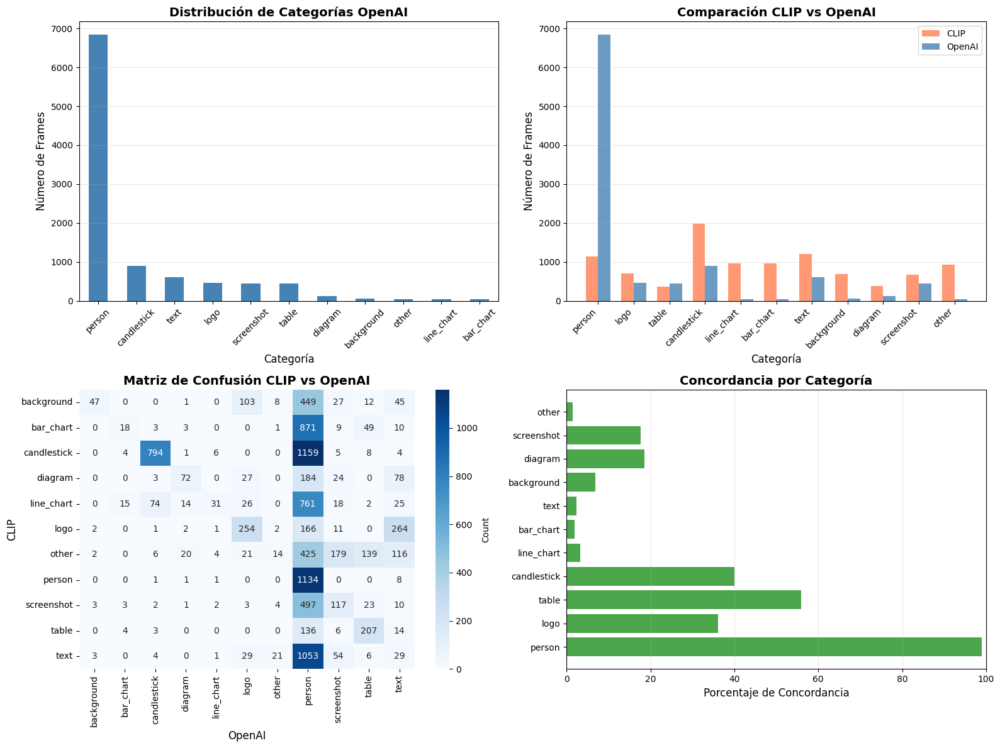

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns

# Solo si hay datos de OpenAI
if 'openai_category_code' in df_frames_selected.columns and df_frames_selected['openai_category_code'].notna().any():
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    # 1. Distribución de categorías OpenAI
    ax1 = axes[0, 0]
    if 'openai_category_code' in df_frames_selected.columns:
        openai_counts = df_frames_selected[df_frames_selected['openai_category_code'] != '']['openai_category_code'].value_counts()
        openai_counts.plot(kind='bar', ax=ax1, color='steelblue')
        ax1.set_title('Distribución de Categorías OpenAI', fontsize=14, fontweight='bold')
        ax1.set_xlabel('Categoría', fontsize=12)
        ax1.set_ylabel('Número de Frames', fontsize=12)
        ax1.tick_params(axis='x', rotation=45)
        ax1.grid(axis='y', alpha=0.3)
    
    # 2. Comparación CLIP vs OpenAI (si ambos están disponibles)
    if 'clip_category_code' in df_frames_selected.columns:
        comparison_df = df_frames_selected[
            (df_frames_selected['clip_category_code'] != '') & 
            (df_frames_selected['openai_category_code'] != '') &
            (df_frames_selected['openai_category_code'] != 'error')
        ]
        
        if len(comparison_df) > 0:
            ax2 = axes[0, 1]
            clip_counts = comparison_df['clip_category_code'].value_counts()
            openai_counts_comp = comparison_df['openai_category_code'].value_counts()
            
            x = np.arange(len(CATEGORY_CODES))
            width = 0.35
            
            clip_values = [clip_counts.get(cat, 0) for cat in CATEGORY_CODES]
            openai_values = [openai_counts_comp.get(cat, 0) for cat in CATEGORY_CODES]
            
            ax2.bar(x - width/2, clip_values, width, label='CLIP', color='coral', alpha=0.8)
            ax2.bar(x + width/2, openai_values, width, label='OpenAI', color='steelblue', alpha=0.8)
            ax2.set_xlabel('Categoría', fontsize=12)
            ax2.set_ylabel('Número de Frames', fontsize=12)
            ax2.set_title('Comparación CLIP vs OpenAI', fontsize=14, fontweight='bold')
            ax2.set_xticks(x)
            ax2.set_xticklabels(CATEGORY_CODES, rotation=45, ha='right')
            ax2.legend()
            ax2.grid(axis='y', alpha=0.3)
    
    # 3. Matriz de confusión visual (si hay comparación)
    if 'clip_category_code' in df_frames_selected.columns and len(comparison_df) > 0:
        ax3 = axes[1, 0]
        confusion = pd.crosstab(
            comparison_df['clip_category_code'],
            comparison_df['openai_category_code']
        )
        sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', ax=ax3, cbar_kws={'label': 'Count'})
        ax3.set_title('Matriz de Confusión CLIP vs OpenAI', fontsize=14, fontweight='bold')
        ax3.set_ylabel('CLIP', fontsize=12)
        ax3.set_xlabel('OpenAI', fontsize=12)
    
    # 4. Porcentaje de concordancia por categoría
    if 'clip_category_code' in df_frames_selected.columns and len(comparison_df) > 0:
        ax4 = axes[1, 1]
        agreement_by_category = []
        for cat in CATEGORY_CODES:
            cat_df = comparison_df[comparison_df['clip_category_code'] == cat]
            if len(cat_df) > 0:
                agreement = (cat_df['clip_category_code'] == cat_df['openai_category_code']).sum()
                agreement_pct = (agreement / len(cat_df)) * 100
                agreement_by_category.append(agreement_pct)
            else:
                agreement_by_category.append(0)
        
        ax4.barh(CATEGORY_CODES, agreement_by_category, color='green', alpha=0.7)
        ax4.set_xlabel('Porcentaje de Concordancia', fontsize=12)
        ax4.set_title('Concordancia por Categoría', fontsize=14, fontweight='bold')
        ax4.set_xlim(0, 100)
        ax4.grid(axis='x', alpha=0.3)
    
    plt.tight_layout()
    os.makedirs("images", exist_ok=True)
    plt.savefig("images/openai_category_distribution.png", dpi=300, bbox_inches='tight')
    print(f"📊 Gráfico guardado en images/openai_category_distribution.png")
    plt.show()
else:
    print("⚠️  No hay datos de OpenAI para visualizar. Ejecuta la clasificación primero.")


## Guardar Resultados


In [27]:
# Guardar dataset con etiquetas de OpenAI
os.makedirs("datasets", exist_ok=True)

output_path = project_root / "src" / "notebooks" / "datasets" / "df_frames_openai_labeled_v4.csv"
df_frames_selected.to_csv(output_path, index=False)

print(f"💾 Dataset con etiquetas OpenAI guardado:")
print(f"   Path: {output_path}")
print(f"   Shape: {df_frames_selected.shape}")
print(f"   Columnas: {df_frames_selected.columns.tolist()}")

# Guardar estadísticas si hay datos
if 'openai_category_code' in df_frames_selected.columns and df_frames_selected['openai_category_code'].notna().any():
    stats_path = project_root / "src" / "notebooks" / "datasets" / "openai_labeling_stats_v4.csv"
    openai_category_counts = df_frames_selected['openai_category_code'].value_counts()
    openai_category_pct = df_frames_selected['openai_category_code'].value_counts(normalize=True) * 100
    
    stats_df = pd.DataFrame({
        'category_code': openai_category_counts.index,
        'count': openai_category_counts.values,
        'percentage': openai_category_pct.values
    })
    stats_df.to_csv(stats_path, index=False)
    print(f"\n💾 Estadísticas guardadas en: {stats_path}")


💾 Dataset con etiquetas OpenAI guardado:
   Path: /Users/andrestrepo/Documents/repos_personal/proyecto-vision-computador/src/notebooks/datasets/df_frames_openai_labeled_v4.csv
   Shape: (10000, 17)
   Columnas: ['video_id', 'channel', 'video_date', 'video_filename', 'duration', 'frame_path', 'n_frames_original', 'n_frames_filtrado', 'reduction_percentage', 'clip_category_idx', 'clip_category_code', 'clip_category_text', 'clip_score', 'openai_category_code', 'openai_category_text', 'openai_raw_response', 'openai_error']

💾 Estadísticas guardadas en: /Users/andrestrepo/Documents/repos_personal/proyecto-vision-computador/src/notebooks/datasets/openai_labeling_stats_v4.csv


## Resumen


In [28]:
print("=" * 80)
print("RESUMEN DE ETIQUETADO CON OPENAI VISION API")
print("=" * 80)

if 'openai_category_code' in df_frames_selected.columns:
    processed_count = df_frames_selected[df_frames_selected['openai_category_code'] != ''].shape[0]
    print(f"\n✅ Frames procesados: {processed_count:,} / {len(df_frames_selected):,}")
    print(f"✅ Modelo usado: {OPENAI_MODEL}")
    
    if 'clip_category_code' in df_frames_selected.columns:
        comparison_df = df_frames_selected[
            (df_frames_selected['clip_category_code'] != '') & 
            (df_frames_selected['openai_category_code'] != '') &
            (df_frames_selected['openai_category_code'] != 'error')
        ]
        if len(comparison_df) > 0:
            agreement = (comparison_df['clip_category_code'] == comparison_df['openai_category_code']).sum()
            agreement_pct = (agreement / len(comparison_df)) * 100
            print(f"✅ Concordancia con CLIP: {agreement_pct:.2f}%")
    
    print(f"\n💾 Archivos generados:")
    print(f"   - datasets/df_frames_openai_labeled_v2.csv")
    if 'openai_category_code' in df_frames_selected.columns and df_frames_selected['openai_category_code'].notna().any():
        print(f"   - datasets/openai_labeling_stats_v2.csv")
        print(f"   - images/openai_category_distribution.png")
    
    print(f"\n💡 Próximos pasos:")
    print(f"   - Revisar ejemplos visuales para validar calidad de etiquetas")
    print(f"   - Comparar resultados entre CLIP y OpenAI")
    print(f"   - Usar etiquetas para entrenar modelo de clasificación")
    print(f"   - Analizar casos de desacuerdo entre modelos")
else:
    print("\n⚠️  No se han procesado frames aún. Ejecuta la clasificación primero.")


RESUMEN DE ETIQUETADO CON OPENAI VISION API

✅ Frames procesados: 10,000 / 10,000
✅ Modelo usado: gpt-4.1
✅ Concordancia con CLIP: 27.17%

💾 Archivos generados:
   - datasets/df_frames_openai_labeled_v2.csv
   - datasets/openai_labeling_stats_v2.csv
   - images/openai_category_distribution.png

💡 Próximos pasos:
   - Revisar ejemplos visuales para validar calidad de etiquetas
   - Comparar resultados entre CLIP y OpenAI
   - Usar etiquetas para entrenar modelo de clasificación
   - Analizar casos de desacuerdo entre modelos


## Validación Visual de Etiquetas

Esta sección permite revisar visualmente los resultados del etiquetado para validar la calidad de las etiquetas asignadas por OpenAI Vision API.


In [29]:
# Función para mostrar ejemplos de una categoría específica de OpenAI
def show_openai_category_examples(category_code, n_examples=10, compare_with_clip=True):
    """
    Muestra ejemplos visuales de frames etiquetados con una categoría específica por OpenAI.
    
    Args:
        category_code: Código de la categoría a mostrar
        n_examples: Número de ejemplos a mostrar
        compare_with_clip: Si True, muestra también la etiqueta de CLIP para comparar
    """
    # Filtrar por categoría de OpenAI
    category_frames = df_frames_selected[
        (df_frames_selected['openai_category_code'] == category_code) &
        (df_frames_selected['openai_category_code'] != 'error')
    ].copy()
    
    if len(category_frames) == 0:
        print(f"❌ No se encontraron frames con categoría OpenAI '{category_code}'")
        return
    
    # Tomar muestras aleatorias
    if len(category_frames) > n_examples:
        category_frames = category_frames.sample(n=n_examples, random_state=42)
    else:
        category_frames = category_frames
    
    print(f"🖼️  Ejemplos de categoría OpenAI '{category_code}' ({len(category_frames)} de {len(df_frames_selected[df_frames_selected['openai_category_code'] == category_code])} totales):")
    
    if compare_with_clip and 'clip_category_code' in df_frames_selected.columns:
        # Calcular concordancia
        agreement = (category_frames['clip_category_code'] == category_frames['openai_category_code']).sum()
        agreement_pct = (agreement / len(category_frames)) * 100
        print(f"   Concordancia con CLIP: {agreement} / {len(category_frames)} ({agreement_pct:.1f}%)")
    
    print()
    
    # Calcular grid de imágenes
    cols = 5
    rows = (len(category_frames) + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(20, 4*rows))
    if rows == 1:
        axes = axes.reshape(1, -1)
    
    for i, (idx, row) in enumerate(category_frames.iterrows()):
        row_idx = i // cols
        col_idx = i % cols
        
        try:
            image = Image.open(row['frame_path'])
            axes[row_idx, col_idx].imshow(image)
            
            # Construir título
            title = f"OpenAI: {category_code}"
            if compare_with_clip and 'clip_category_code' in df_frames_selected.columns:
                clip_cat = row['clip_category_code']
                if clip_cat != category_code:
                    title += f"\nCLIP: {clip_cat} ⚠️"
                else:
                    title += f"\nCLIP: {clip_cat} ✅"
            
            title += f"\n{row['channel'][:25]}"
            axes[row_idx, col_idx].set_title(title, fontsize=9)
            axes[row_idx, col_idx].axis('off')
        except Exception as e:
            axes[row_idx, col_idx].text(0.5, 0.5, f'Error\n{str(e)[:30]}', 
                                        ha='center', va='center', fontsize=8)
            axes[row_idx, col_idx].axis('off')
    
    # Ocultar ejes vacíos
    for i in range(len(category_frames), rows * cols):
        row_idx = i // cols
        col_idx = i % cols
        axes[row_idx, col_idx].axis('off')
    
    plt.suptitle(f'Top {len(category_frames)} Ejemplos - Categoría OpenAI: {category_code}', 
                 fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return category_frames


### Revisar Ejemplos por Categoría OpenAI

Ejecuta las siguientes celdas para revisar ejemplos visuales de cada categoría etiquetada por OpenAI. Esto te ayudará a validar la calidad del etiquetado.


🖼️  Ejemplos de categoría OpenAI 'logo' (15 de 463 totales):
   Concordancia con CLIP: 11 / 15 (73.3%)



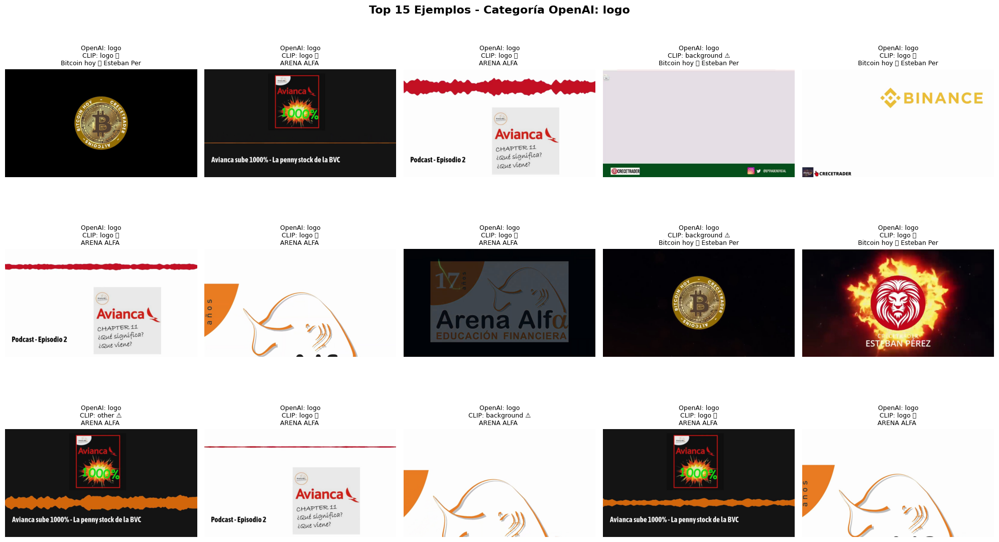

In [30]:
# Configuración para revisión
CATEGORY_TO_REVIEW = CATEGORY_CODES[1]  # "person" - Cambia esto para revisar otra categoría
N_EXAMPLES = 15  # Número de ejemplos a mostrar
COMPARE_WITH_CLIP = True  # Si True, muestra también la etiqueta de CLIP

# Mostrar ejemplos
if 'openai_category_code' in df_frames_selected.columns:
    examples = show_openai_category_examples(
        category_code=CATEGORY_TO_REVIEW,
        n_examples=N_EXAMPLES,
        compare_with_clip=COMPARE_WITH_CLIP
    )
else:
    print("⚠️  No hay datos de OpenAI aún. Ejecuta la clasificación primero.")


🖼️  Ejemplos de categoría OpenAI 'candlestick' (20 de 891 totales):
   Concordancia con CLIP: 19 / 20 (95.0%)



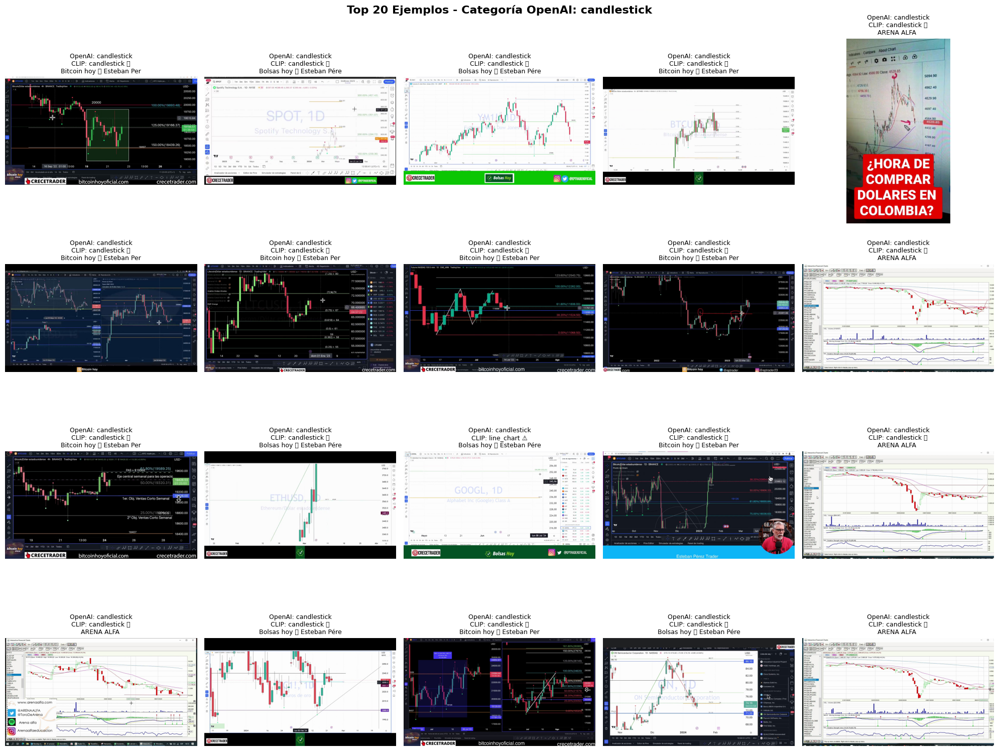

In [31]:
# Revisar otra categoría (ejemplo: candlestick)
CATEGORY_TO_REVIEW = CATEGORY_CODES[3]  # "candlestick" - Cambia esto para revisar otra categoría
N_EXAMPLES = 20
COMPARE_WITH_CLIP = True

if 'openai_category_code' in df_frames_selected.columns:
    examples = show_openai_category_examples(
        category_code=CATEGORY_TO_REVIEW,
        n_examples=N_EXAMPLES,
        compare_with_clip=COMPARE_WITH_CLIP
    )
else:
    print("⚠️  No hay datos de OpenAI aún. Ejecuta la clasificación primero.")


### Vista General de Todas las Categorías

Muestra un ejemplo representativo de cada categoría etiquetada por OpenAI.


📊 Vista general de todas las categorías OpenAI:
📊 Vista general guardada en images/openai_category_examples_overview.png


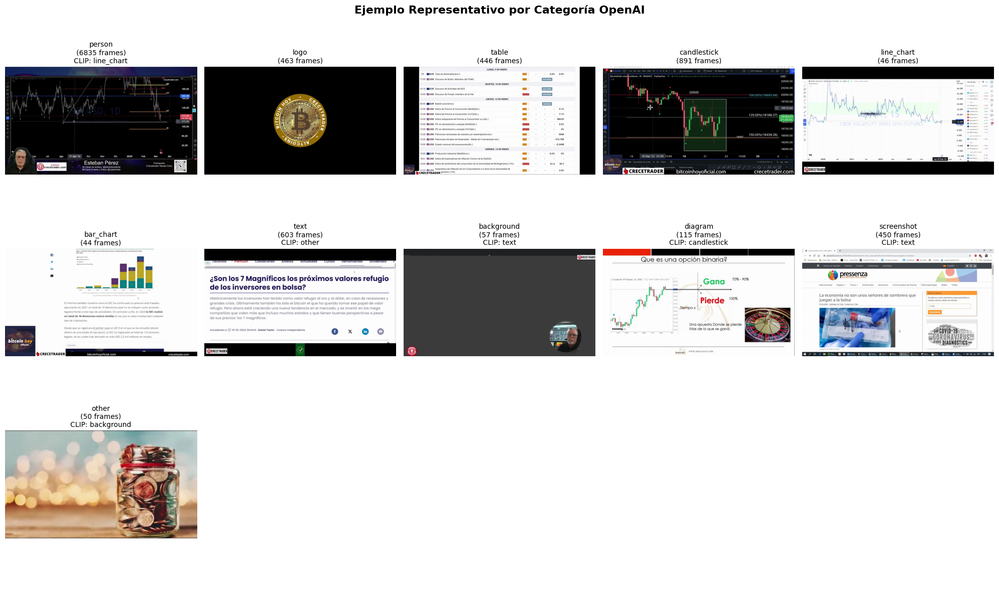

In [32]:
# Mostrar todas las categorías (un ejemplo por categoría)
if 'openai_category_code' in df_frames_selected.columns and df_frames_selected['openai_category_code'].notna().any():
    print("📊 Vista general de todas las categorías OpenAI:")
    print("=" * 80)
    
    # Configurar grid
    n_categories = len(CATEGORY_CODES)
    cols = 5
    rows = (n_categories + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(20, 4*rows))
    if rows == 1:
        axes = axes.reshape(1, -1)
    
    for cat_idx, category_code in enumerate(CATEGORY_CODES):
        row_idx = cat_idx // cols
        col_idx = cat_idx % cols
        
        category_frames = df_frames_selected[
            (df_frames_selected['openai_category_code'] == category_code) &
            (df_frames_selected['openai_category_code'] != 'error')
        ]
        
        if len(category_frames) == 0:
            axes[row_idx, col_idx].text(0.5, 0.5, f'{category_code}\nSin ejemplos', 
                                        ha='center', va='center', fontsize=12)
            axes[row_idx, col_idx].axis('off')
            continue
        
        # Tomar un ejemplo aleatorio
        sample_frame = category_frames.sample(1, random_state=42).iloc[0]
        
        try:
            image = Image.open(sample_frame['frame_path'])
            axes[row_idx, col_idx].imshow(image)
            
            # Construir título
            title = f"{category_code}\n({len(category_frames)} frames)"
            if 'clip_category_code' in df_frames_selected.columns:
                clip_cat = sample_frame['clip_category_code']
                if clip_cat != category_code:
                    title += f"\nCLIP: {clip_cat}"
            
            axes[row_idx, col_idx].set_title(title, fontsize=10)
            axes[row_idx, col_idx].axis('off')
        except Exception as e:
            axes[row_idx, col_idx].text(0.5, 0.5, f'{category_code}\nError', 
                                        ha='center', va='center', fontsize=10)
            axes[row_idx, col_idx].axis('off')
    
    # Ocultar ejes vacíos
    for i in range(n_categories, rows * cols):
        row_idx = i // cols
        col_idx = i % cols
        axes[row_idx, col_idx].axis('off')
    
    plt.suptitle('Ejemplo Representativo por Categoría OpenAI', fontsize=16, fontweight='bold')
    plt.tight_layout()
    os.makedirs("images", exist_ok=True)
    plt.savefig("images/openai_category_examples_overview.png", dpi=300, bbox_inches='tight')
    print(f"📊 Vista general guardada en images/openai_category_examples_overview.png")
    plt.show()
else:
    print("⚠️  No hay datos de OpenAI aún. Ejecuta la clasificación primero.")


### Análisis de Desacuerdos entre CLIP y OpenAI

Revisa visualmente los casos donde CLIP y OpenAI no están de acuerdo para entender las diferencias entre los modelos.


📊 FRAMES CON DESACUERDO ENTRE CLIP Y OPENAI:
   Total de desacuerdos: 7,283

📊 TOP 10 DESACUERDOS MÁS FRECUENTES:
   CLIP: candlestick     → OpenAI: person          (1,159 veces)
   CLIP: text            → OpenAI: person          (1,053 veces)
   CLIP: bar_chart       → OpenAI: person          (871 veces)
   CLIP: line_chart      → OpenAI: person          (761 veces)
   CLIP: screenshot      → OpenAI: person          (497 veces)
   CLIP: background      → OpenAI: person          (449 veces)
   CLIP: other           → OpenAI: person          (425 veces)
   CLIP: logo            → OpenAI: text            (264 veces)
   CLIP: diagram         → OpenAI: person          (184 veces)
   CLIP: other           → OpenAI: screenshot      (179 veces)

🖼️  Mostrando ejemplos de desacuerdos...
📊 Ejemplos guardados en images/openai_clip_disagreements.png


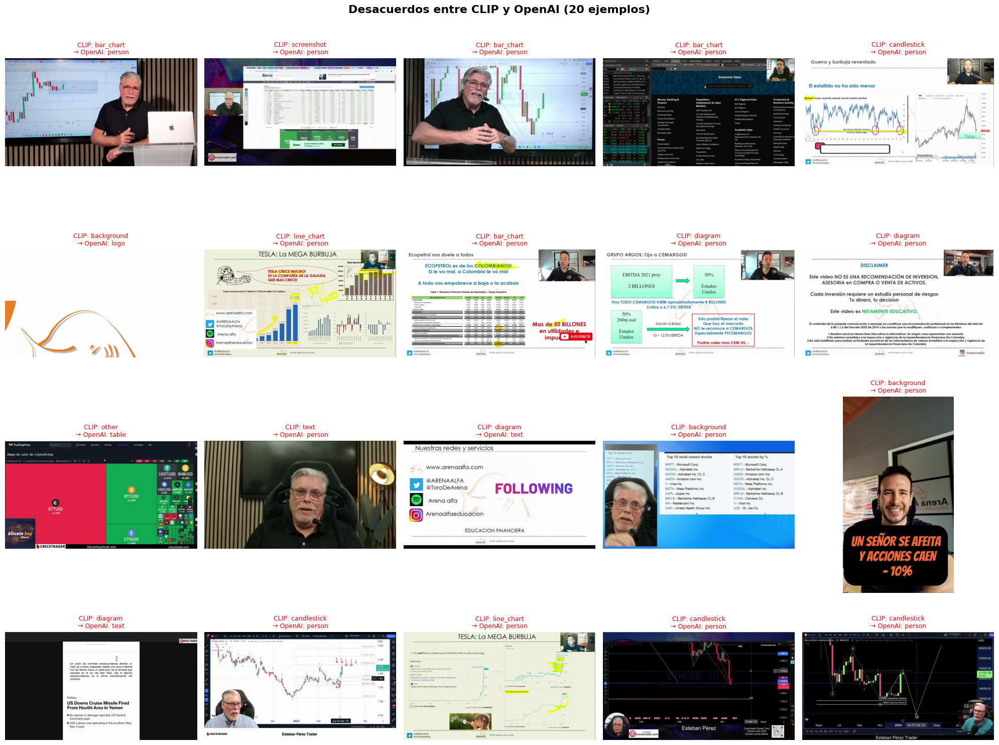

In [33]:
# Analizar y mostrar desacuerdos entre CLIP y OpenAI
if 'clip_category_code' in df_frames_selected.columns and 'openai_category_code' in df_frames_selected.columns:
    disagreements = df_frames_selected[
        (df_frames_selected['clip_category_code'] != '') & 
        (df_frames_selected['openai_category_code'] != '') &
        (df_frames_selected['openai_category_code'] != 'error') &
        (df_frames_selected['clip_category_code'] != df_frames_selected['openai_category_code'])
    ].copy()
    
    if len(disagreements) > 0:
        print(f"📊 FRAMES CON DESACUERDO ENTRE CLIP Y OPENAI:")
        print("=" * 80)
        print(f"   Total de desacuerdos: {len(disagreements):,}")
        
        # Mostrar top desacuerdos más frecuentes
        disagreement_counts = disagreements.groupby(['clip_category_code', 'openai_category_code']).size().sort_values(ascending=False)
        print(f"\n📊 TOP 10 DESACUERDOS MÁS FRECUENTES:")
        for (clip_cat, openai_cat), count in disagreement_counts.head(10).items():
            print(f"   CLIP: {clip_cat:15s} → OpenAI: {openai_cat:15s} ({count:,} veces)")
        
        # Mostrar ejemplos visuales de desacuerdos
        print(f"\n🖼️  Mostrando ejemplos de desacuerdos...")
        sample_disagreements = disagreements.sample(min(20, len(disagreements)), random_state=42)
        
        cols = 5
        rows = (len(sample_disagreements) + cols - 1) // cols
        fig, axes = plt.subplots(rows, cols, figsize=(20, 4*rows))
        if rows == 1:
            axes = axes.reshape(1, -1)
        
        for i, (idx, row) in enumerate(sample_disagreements.iterrows()):
            row_idx = i // cols
            col_idx = i % cols
            
            try:
                image = Image.open(row['frame_path'])
                axes[row_idx, col_idx].imshow(image)
                title = f"CLIP: {row['clip_category_code']}\n→ OpenAI: {row['openai_category_code']}"
                axes[row_idx, col_idx].set_title(title, fontsize=9, color='red')
                axes[row_idx, col_idx].axis('off')
            except Exception as e:
                axes[row_idx, col_idx].text(0.5, 0.5, f'Error', ha='center', va='center', fontsize=8)
                axes[row_idx, col_idx].axis('off')
        
        # Ocultar ejes vacíos
        for i in range(len(sample_disagreements), rows * cols):
            row_idx = i // cols
            col_idx = i % cols
            axes[row_idx, col_idx].axis('off')
        
        plt.suptitle(f'Desacuerdos entre CLIP y OpenAI ({len(sample_disagreements)} ejemplos)', 
                     fontsize=16, fontweight='bold')
        plt.tight_layout()
        os.makedirs("images", exist_ok=True)
        plt.savefig("images/openai_clip_disagreements.png", dpi=300, bbox_inches='tight')
        print(f"📊 Ejemplos guardados en images/openai_clip_disagreements.png")
        plt.show()
    else:
        print("✅ No hay desacuerdos entre CLIP y OpenAI (o no hay suficientes datos para comparar)")
else:
    print("⚠️  No hay datos de ambos modelos para comparar. Ejecuta la clasificación primero.")


### Revisar Desacuerdos por Tipo

Revisa desacuerdos específicos entre CLIP y OpenAI para categorías particulares.


🖼️  Desacuerdos: CLIP='line_chart' → OpenAI='candlestick'
   Total: 68 frames


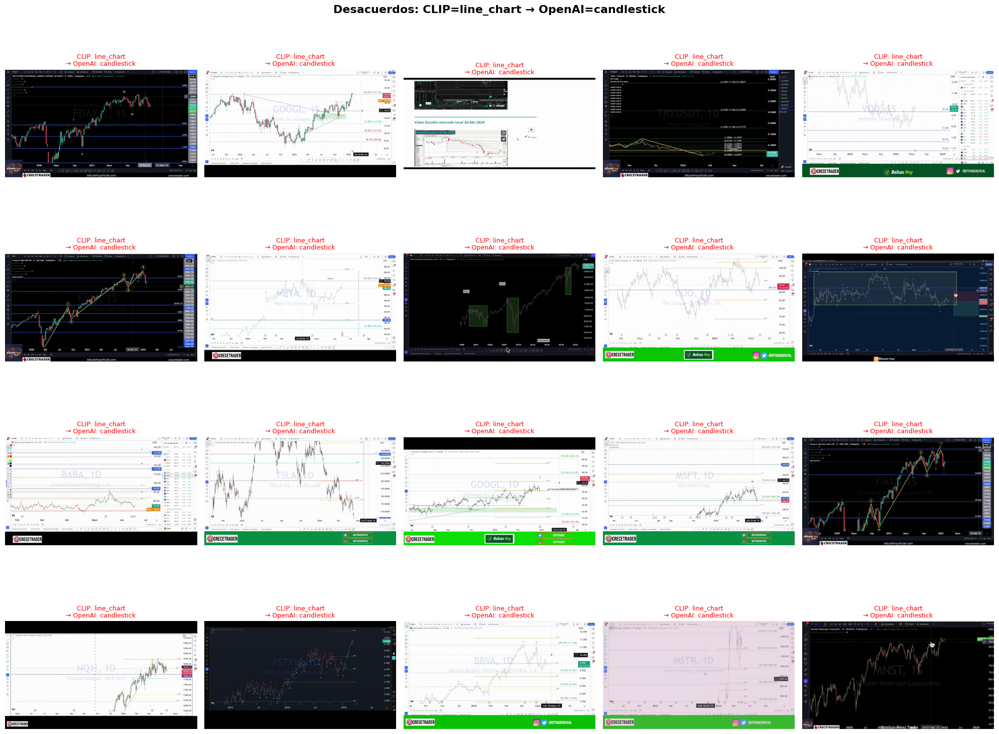

In [63]:
# Función para mostrar desacuerdos específicos
def show_disagreement_examples(clip_category, openai_category, n_examples=10):
    """
    Muestra ejemplos donde CLIP clasificó como clip_category y OpenAI como openai_category.
    
    Args:
        clip_category: Categoría asignada por CLIP
        openai_category: Categoría asignada por OpenAI
        n_examples: Número de ejemplos a mostrar
    """
    if 'clip_category_code' not in df_frames_selected.columns or 'openai_category_code' not in df_frames_selected.columns:
        print("⚠️  No hay datos de ambos modelos para comparar")
        return
    
    disagreement_frames = df_frames_selected[
        (df_frames_selected['clip_category_code'] == clip_category) &
        (df_frames_selected['openai_category_code'] == openai_category) &
        (df_frames_selected['openai_category_code'] != 'error')
    ].copy()
    
    if len(disagreement_frames) == 0:
        print(f"❌ No se encontraron frames donde CLIP='{clip_category}' y OpenAI='{openai_category}'")
        return
    
    print(f"🖼️  Desacuerdos: CLIP='{clip_category}' → OpenAI='{openai_category}'")
    print(f"   Total: {len(disagreement_frames)} frames")
    
    # Tomar muestras
    if len(disagreement_frames) > n_examples:
        disagreement_frames = disagreement_frames.sample(n=n_examples, random_state=42)
    
    # Calcular grid
    cols = 5
    rows = (len(disagreement_frames) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 4*rows))
    if rows == 1:
        axes = axes.reshape(1, -1)
    
    for i, (idx, row) in enumerate(disagreement_frames.iterrows()):
        row_idx = i // cols
        col_idx = i % cols
        
        try:
            image = Image.open(row['frame_path'])
            axes[row_idx, col_idx].imshow(image)
            title = f"CLIP: {clip_category}\n→ OpenAI: {openai_category}"
            axes[row_idx, col_idx].set_title(title, fontsize=9, color='red')
            axes[row_idx, col_idx].axis('off')
        except Exception as e:
            axes[row_idx, col_idx].text(0.5, 0.5, f'Error', ha='center', va='center', fontsize=8)
            axes[row_idx, col_idx].axis('off')
    
    # Ocultar ejes vacíos
    for i in range(len(disagreement_frames), rows * cols):
        row_idx = i // cols
        col_idx = i % cols
        axes[row_idx, col_idx].axis('off')
    
    plt.suptitle(f'Desacuerdos: CLIP={clip_category} → OpenAI={openai_category}', 
                 fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return disagreement_frames

# Ejemplo: Revisar desacuerdos específicos
# Cambia estos valores según los desacuerdos que quieras revisar
if 'clip_category_code' in df_frames_selected.columns and 'openai_category_code' in df_frames_selected.columns:
    CLIP_CAT = "line_chart"  # Cambia esto
    OPENAI_CAT = "candlestick"  # Cambia esto
    N_EXAMPLES = 20
    
    examples = show_disagreement_examples(CLIP_CAT, OPENAI_CAT, N_EXAMPLES)
else:
    print("⚠️  No hay datos de ambos modelos para comparar. Ejecuta la clasificación primero.")


🖼️  Desacuerdos: CLIP='candlestick' → OpenAI='person'
   Total: 1184 frames


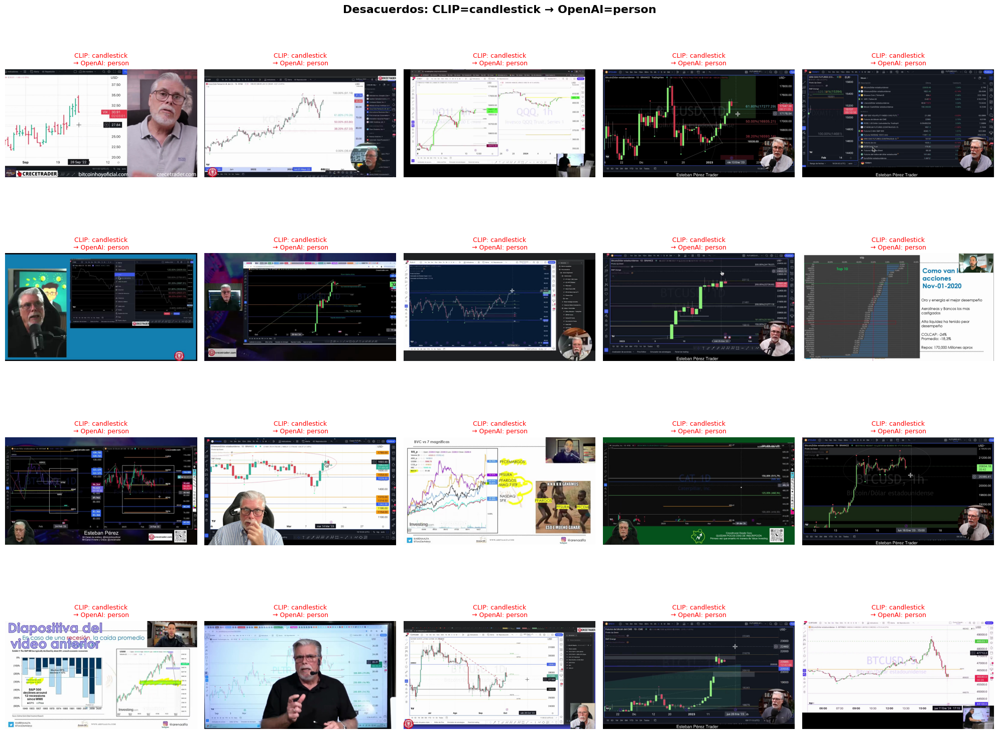

In [64]:
if 'clip_category_code' in df_frames_selected.columns and 'openai_category_code' in df_frames_selected.columns:
    CLIP_CAT = "candlestick"  # Cambia esto
    OPENAI_CAT = "person"  # Cambia esto
    N_EXAMPLES = 20
    
    examples = show_disagreement_examples(CLIP_CAT, OPENAI_CAT, N_EXAMPLES)
else:
    print("⚠️  No hay datos de ambos modelos para comparar. Ejecuta la clasificación primero.")

In [65]:
if 'clip_category_code' in df_frames_selected.columns and 'openai_category_code' in df_frames_selected.columns:
    CLIP_CAT = "person"  # Cambia esto
    OPENAI_CAT = "candlestick"  # Cambia esto
    N_EXAMPLES = 20
    
    examples = show_disagreement_examples(CLIP_CAT, OPENAI_CAT, N_EXAMPLES)
else:
    print("⚠️  No hay datos de ambos modelos para comparar. Ejecuta la clasificación primero.")

❌ No se encontraron frames donde CLIP='person' y OpenAI='candlestick'


### Casos de Alta Confianza

Revisa casos donde ambos modelos están de acuerdo para validar que las etiquetas son correctas.


✅ CASOS DE ACUERDO ENTRE CLIP Y OPENAI:
   Total de acuerdos: 2,660

📊 Distribución de acuerdos por categoría:
   person         :  1,136 frames
   candlestick    :    754 frames
   logo           :    221 frames
   table          :    204 frames
   screenshot     :    112 frames
   diagram        :     69 frames
   background     :     62 frames
   line_chart     :     38 frames
   text           :     29 frames
   bar_chart      :     20 frames

🖼️  Mostrando ejemplos de acuerdos...
📊 Ejemplos guardados en images/openai_clip_agreements.png


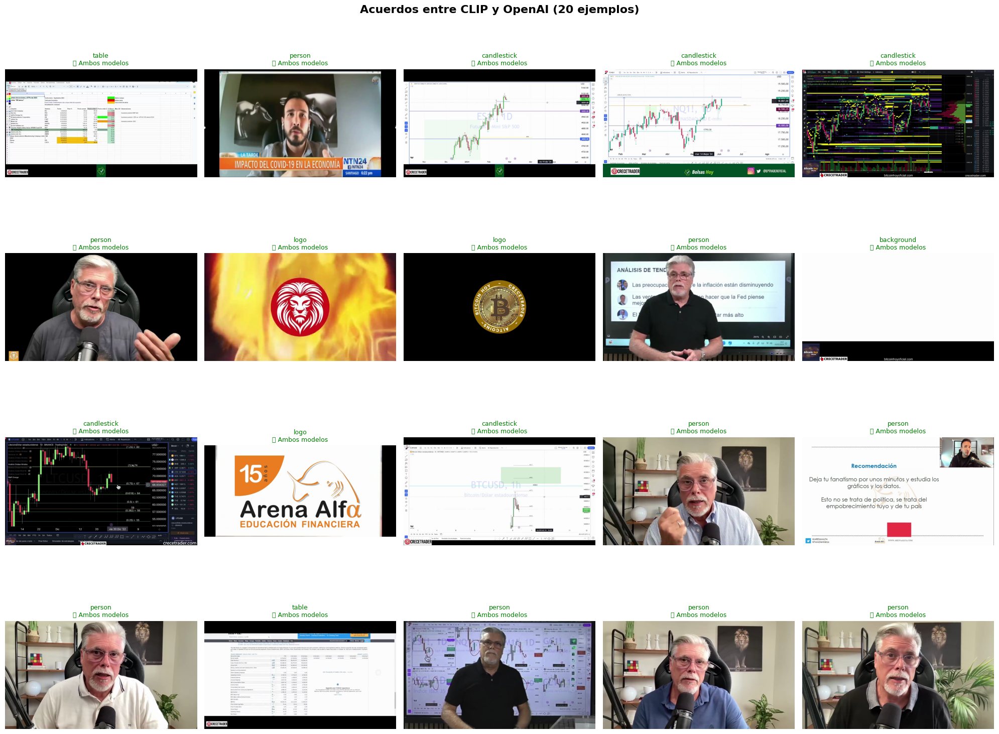

In [61]:
# Mostrar casos donde ambos modelos están de acuerdo (alta confianza)
if 'clip_category_code' in df_frames_selected.columns and 'openai_category_code' in df_frames_selected.columns:
    agreements = df_frames_selected[
        (df_frames_selected['clip_category_code'] != '') & 
        (df_frames_selected['openai_category_code'] != '') &
        (df_frames_selected['openai_category_code'] != 'error') &
        (df_frames_selected['clip_category_code'] == df_frames_selected['openai_category_code'])
    ].copy()
    
    if len(agreements) > 0:
        print(f"✅ CASOS DE ACUERDO ENTRE CLIP Y OPENAI:")
        print("=" * 80)
        print(f"   Total de acuerdos: {len(agreements):,}")
        
        # Mostrar distribución por categoría
        agreement_by_category = agreements['clip_category_code'].value_counts()
        print(f"\n📊 Distribución de acuerdos por categoría:")
        for cat, count in agreement_by_category.head(10).items():
            print(f"   {cat:15s}: {count:6,} frames")
        
        # Mostrar ejemplos visuales de acuerdos
        print(f"\n🖼️  Mostrando ejemplos de acuerdos...")
        sample_agreements = agreements.sample(min(20, len(agreements)), random_state=42)
        
        cols = 5
        rows = (len(sample_agreements) + cols - 1) // cols
        fig, axes = plt.subplots(rows, cols, figsize=(20, 4*rows))
        if rows == 1:
            axes = axes.reshape(1, -1)
        
        for i, (idx, row) in enumerate(sample_agreements.iterrows()):
            row_idx = i // cols
            col_idx = i % cols
            
            try:
                image = Image.open(row['frame_path'])
                axes[row_idx, col_idx].imshow(image)
                title = f"{row['clip_category_code']}\n✅ Ambos modelos"
                axes[row_idx, col_idx].set_title(title, fontsize=9, color='green')
                axes[row_idx, col_idx].axis('off')
            except Exception as e:
                axes[row_idx, col_idx].text(0.5, 0.5, f'Error', ha='center', va='center', fontsize=8)
                axes[row_idx, col_idx].axis('off')
        
        # Ocultar ejes vacíos
        for i in range(len(sample_agreements), rows * cols):
            row_idx = i // cols
            col_idx = i % cols
            axes[row_idx, col_idx].axis('off')
        
        plt.suptitle(f'Acuerdos entre CLIP y OpenAI ({len(sample_agreements)} ejemplos)', 
                     fontsize=16, fontweight='bold')
        plt.tight_layout()
        os.makedirs("images", exist_ok=True)
        plt.savefig("images/openai_clip_agreements.png", dpi=300, bbox_inches='tight')
        print(f"📊 Ejemplos guardados en images/openai_clip_agreements.png")
        plt.show()
    else:
        print("⚠️  No hay acuerdos entre CLIP y OpenAI (o no hay suficientes datos)")
else:
    print("⚠️  No hay datos de ambos modelos para comparar. Ejecuta la clasificación primero.")


### Prueba del Prompt Mejorado

Prueba el prompt mejorado con imágenes problemáticas donde CLIP clasifica como gráfico/tabla pero OpenAI clasificó como "person".


🧪 Probando prompt mejorado con 30 imágenes:
   📉 Problemáticas (CLIP: gráfico/tabla, OpenAI: person): 20 imágenes
   ✅ Correctas (CLIP: person, OpenAI: person): 10 imágenes




Probando prompt mejorado: 100%|██████████| 30/30 [01:01<00:00,  2.04s/it]



📊 RESULTADOS DE LA PRUEBA:

📉 CASOS PROBLEMÁTICOS (CLIP: gráfico/tabla, OpenAI anterior: person):
   Total: 20 imágenes

   ✅ Mejorados (ya no son 'person'): 20/20 (100.0%)
   ❌ Siguen siendo 'person': 0/20 (0.0%)
   🎯 Coinciden con CLIP: 13/20 (65.0%)

✅ CASOS CORRECTOS DE PERSON (CLIP: person, OpenAI anterior: person):
   Total: 10 imágenes

   ✅ Se mantienen como 'person': 8/10 (80.0%)
   ❌ Cambiaron de 'person': 2/10 (20.0%)

📊 RESUMEN GENERAL:
   Total de imágenes probadas: 30
   Casos problemáticos: 20
   Casos correctos de person: 10

📋 Detalle por imagen:
📉 ⚠️ CLIP: candlestick     | Antes: person          | Ahora: line_chart     
📉 ✅ CLIP: candlestick     | Antes: person          | Ahora: candlestick    
📉 ✅ CLIP: candlestick     | Antes: person          | Ahora: candlestick    
📉 ✅ CLIP: candlestick     | Antes: person          | Ahora: candlestick    
📉 ✅ CLIP: candlestick     | Antes: person          | Ahora: candlestick    
📉 ⚠️ CLIP: bar_chart       | Antes: person      

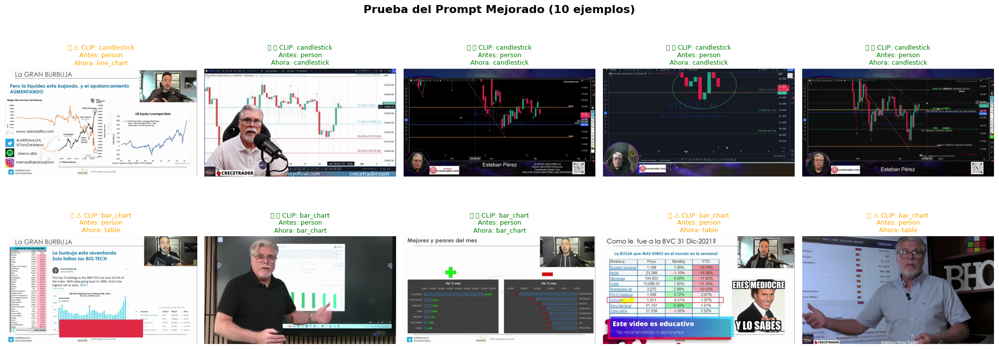

In [ ]:
# Prueba del prompt mejorado con imágenes problemáticas
# 1. Tomar ejemplos donde CLIP clasifica como gráfico/tabla pero OpenAI clasificó como "person" (deberían mejorar)
# 2. Tomar ejemplos donde CLIP clasifica como "person" y OpenAI también clasificó como "person" (deberían mantenerse)

if 'clip_category_code' in df_frames_selected.columns and 'openai_category_code' in df_frames_selected.columns:
    # Obtener ejemplos problemáticos: CLIP dice gráfico/tabla, OpenAI dice person
    problematic_categories = ['candlestick', 'bar_chart', 'line_chart', 'table']
    
    test_cases_problematic = []
    for clip_cat in problematic_categories:
        cases = df_frames_selected[
            (df_frames_selected['clip_category_code'] == clip_cat) &
            (df_frames_selected['openai_category_code'] == 'person')
        ].head(5)  # Tomar 5 ejemplos de cada categoría
        
        if len(cases) > 0:
            test_cases_problematic.append(cases)
    
    # Obtener ejemplos correctos: CLIP dice person, OpenAI dice person (deberían mantenerse)
    test_cases_correct = []
    correct_cases = df_frames_selected[
        (df_frames_selected['clip_category_code'] == 'person') &
        (df_frames_selected['openai_category_code'] == 'person')
    ].head(10)  # Tomar 10 ejemplos de person correctos
    
    if len(correct_cases) > 0:
        test_cases_correct.append(correct_cases)
    
    # Combinar ambos tipos de casos
    all_test_cases = []
    if len(test_cases_problematic) > 0:
        all_test_cases.extend(test_cases_problematic)
    if len(test_cases_correct) > 0:
        all_test_cases.extend(test_cases_correct)
    
    if len(all_test_cases) > 0:
        test_df = pd.concat(all_test_cases, ignore_index=True)
        
        # Agregar columna para identificar el tipo de caso
        test_df['test_type'] = test_df.apply(
            lambda row: 'problematic' if (row['clip_category_code'] in problematic_categories and 
                                         row['openai_category_code'] == 'person') 
                        else 'correct_person',
            axis=1
        )
        
        n_problematic = (test_df['test_type'] == 'problematic').sum()
        n_correct = (test_df['test_type'] == 'correct_person').sum()
        
        print(f"🧪 Probando prompt mejorado con {len(test_df)} imágenes:")
        print(f"   📉 Problemáticas (CLIP: gráfico/tabla, OpenAI: person): {n_problematic} imágenes")
        print(f"   ✅ Correctas (CLIP: person, OpenAI: person): {n_correct} imágenes")
        print(f"\n{'='*80}\n")
        
        # Probar con el prompt mejorado
        results = []
        for idx, row in tqdm(test_df.iterrows(), total=len(test_df), desc="Probando prompt mejorado"):
            frame_path = row['frame_path']
            clip_cat = row['clip_category_code']
            old_openai_cat = row['openai_category_code']
            
            # Clasificar con el prompt mejorado
            result = classify_image_openai(
                frame_path,
                client,
                OPENAI_MODEL,
                PROMPT_TEMPLATE,  # Usar el prompt mejorado
                max_retries=MAX_RETRIES
            )
            
            new_openai_cat = result.get('category_code', 'error')
            
            # Determinar el tipo de caso
            test_type = row.get('test_type', 'unknown')
            
            # Calcular el estado de mejora según el tipo de caso
            if test_type == 'problematic':
                # Casos problemáticos: deberían mejorar (dejar de ser person y coincidir con CLIP)
                if new_openai_cat != 'person' and new_openai_cat == clip_cat:
                    improved_status = '✅'
                elif new_openai_cat == 'person':
                    improved_status = '❌'
                else:
                    improved_status = '⚠️'
            else:
                # Casos correctos de person: deberían mantenerse como person
                if new_openai_cat == 'person':
                    improved_status = '✅'
                else:
                    improved_status = '❌'
            
            results.append({
                'frame_path': frame_path,
                'clip_category': clip_cat,
                'old_openai_category': old_openai_cat,
                'new_openai_category': new_openai_cat,
                'test_type': test_type,
                'improved': improved_status
            })
            
            # Pequeño delay para evitar rate limits
            time.sleep(REQUEST_DELAY)
        
        # Mostrar resultados
        results_df = pd.DataFrame(results)
        
        print(f"\n📊 RESULTADOS DE LA PRUEBA:")
        print(f"{'='*80}\n")
        
        # Separar resultados por tipo de caso
        problematic_results = results_df[results_df['test_type'] == 'problematic']
        correct_person_results = results_df[results_df['test_type'] == 'correct_person']
        
        # Estadísticas para casos problemáticos
        if len(problematic_results) > 0:
            print(f"📉 CASOS PROBLEMÁTICOS (CLIP: gráfico/tabla, OpenAI anterior: person):")
            print(f"   Total: {len(problematic_results)} imágenes\n")
            
            improved_problematic = (problematic_results['new_openai_category'] != 'person').sum()
            still_person_problematic = (problematic_results['new_openai_category'] == 'person').sum()
            matches_clip_problematic = (problematic_results['new_openai_category'] == problematic_results['clip_category']).sum()
            
            print(f"   ✅ Mejorados (ya no son 'person'): {improved_problematic}/{len(problematic_results)} ({improved_problematic/len(problematic_results)*100:.1f}%)")
            print(f"   ❌ Siguen siendo 'person': {still_person_problematic}/{len(problematic_results)} ({still_person_problematic/len(problematic_results)*100:.1f}%)")
            print(f"   🎯 Coinciden con CLIP: {matches_clip_problematic}/{len(problematic_results)} ({matches_clip_problematic/len(problematic_results)*100:.1f}%)")
            print()
        
        # Estadísticas para casos correctos de person
        if len(correct_person_results) > 0:
            print(f"✅ CASOS CORRECTOS DE PERSON (CLIP: person, OpenAI anterior: person):")
            print(f"   Total: {len(correct_person_results)} imágenes\n")
            
            still_person_correct = (correct_person_results['new_openai_category'] == 'person').sum()
            changed_from_person = (correct_person_results['new_openai_category'] != 'person').sum()
            
            print(f"   ✅ Se mantienen como 'person': {still_person_correct}/{len(correct_person_results)} ({still_person_correct/len(correct_person_results)*100:.1f}%)")
            print(f"   ❌ Cambiaron de 'person': {changed_from_person}/{len(correct_person_results)} ({changed_from_person/len(correct_person_results)*100:.1f}%)")
            print()
        
        # Estadísticas generales
        print(f"📊 RESUMEN GENERAL:")
        print(f"   Total de imágenes probadas: {len(results_df)}")
        print(f"   Casos problemáticos: {len(problematic_results)}")
        print(f"   Casos correctos de person: {len(correct_person_results)}")
        print()
        
        print(f"📋 Detalle por imagen:")
        print(f"{'='*80}")
        for _, r in results_df.iterrows():
            test_type_label = "📉" if r['test_type'] == 'problematic' else "✅"
            print(f"{test_type_label} {r['improved']} CLIP: {r['clip_category']:15s} | Antes: {r['old_openai_category']:15s} | Ahora: {r['new_openai_category']:15s}")
        
    else:
        print("⚠️  No se encontraron casos problemáticos para probar")
else:
    print("⚠️  No hay datos de ambos modelos para comparar. Ejecuta la clasificación primero.")



🖼️  Visualizando resultados...
📊 Resultados guardados en images/prompt_improvement_test.png


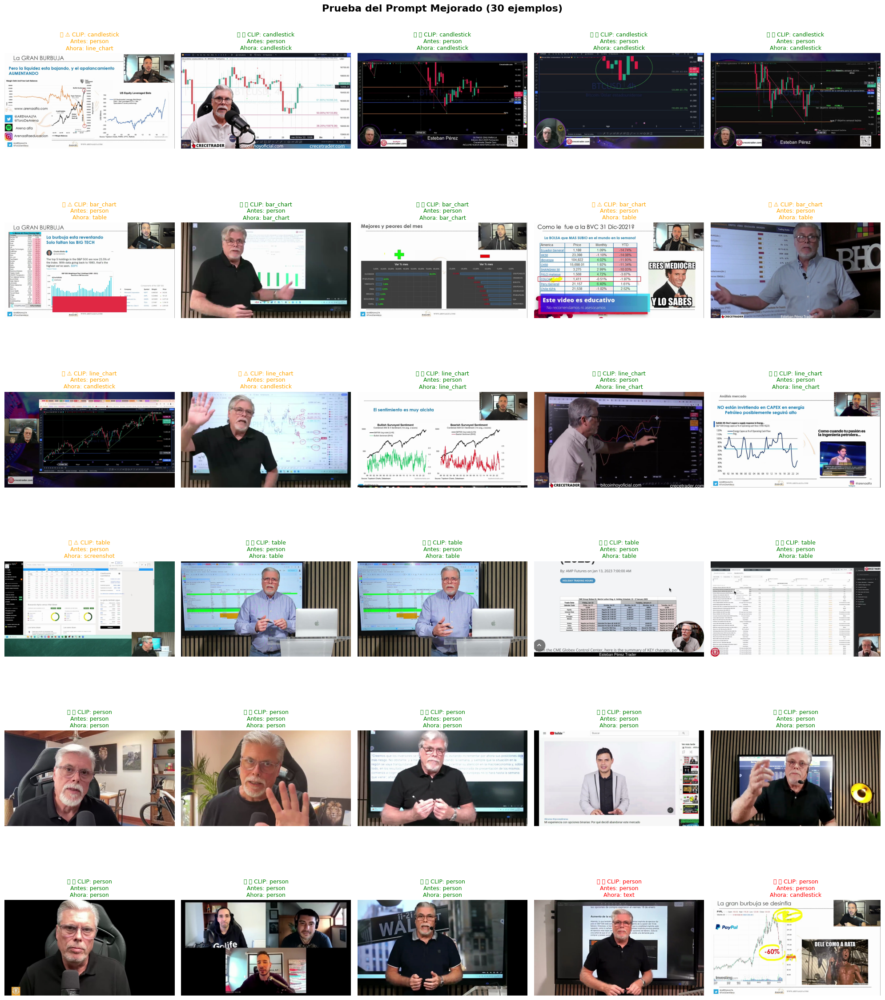

In [42]:
# Visualizar resultados
print(f"\n🖼️  Visualizando resultados...")
n_samples = min(30, len(results_df))  # Mostrar hasta 30 imágenes
sample_results = results_df.head(n_samples)

cols = 5
rows = (n_samples + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(20, 4*rows))
if rows == 1:
    axes = axes.reshape(1, -1) if cols > 1 else np.array([axes])

for i, (_, r) in enumerate(sample_results.iterrows()):
    row_idx = i // cols
    col_idx = i % cols
    
    try:
        image = Image.open(r['frame_path'])
        if rows == 1:
            ax = axes[col_idx] if isinstance(axes, np.ndarray) else axes[0, col_idx]
        else:
            ax = axes[row_idx, col_idx]
        
        ax.imshow(image)
        
        # Construir título con información del tipo de caso
        test_type_label = "📉" if r['test_type'] == 'problematic' else "✅"
        title = f"{test_type_label} {r['improved']} CLIP: {r['clip_category']}\nAntes: {r['old_openai_category']}\nAhora: {r['new_openai_category']}"
        
        # Color según el resultado
        if r['test_type'] == 'problematic':
            # Casos problemáticos: verde si mejoró, rojo si sigue siendo person
            color = 'green' if r['improved'] == '✅' else 'red' if r['improved'] == '❌' else 'orange'
        else:
            # Casos correctos de person: verde si se mantiene como person, rojo si cambió
            color = 'green' if r['improved'] == '✅' else 'red'
        
        ax.set_title(title, fontsize=9, color=color)
        ax.axis('off')
    except Exception as e:
        if rows == 1:
            ax = axes[col_idx] if isinstance(axes, np.ndarray) else axes[0, col_idx]
        else:
            ax = axes[row_idx, col_idx]
        ax.text(0.5, 0.5, f'Error\n{str(e)[:30]}', ha='center', va='center', fontsize=8)
        ax.axis('off')

# Ocultar ejes vacíos
for i in range(n_samples, rows * cols):
    row_idx = i // cols
    col_idx = i % cols
    if rows == 1:
        axes[col_idx].axis('off')
    else:
        axes[row_idx, col_idx].axis('off')

plt.suptitle(f'Prueba del Prompt Mejorado ({n_samples} ejemplos)', fontsize=16, fontweight='bold')
plt.tight_layout()
os.makedirs("images", exist_ok=True)
plt.savefig("images/prompt_improvement_test.png", dpi=300, bbox_inches='tight')
print(f"📊 Resultados guardados en images/prompt_improvement_test.png")
plt.show()